# AI Final Project


In [ ]:
# !pip install -U git+https://github.com/qubvel/segmentation_models.pytorch # for installing segmentation models

## Import Libraries


In [ ]:
import cv2
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import glob
import torch
from torch.utils.data import DataLoader
from torch import nn
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.utils.train import TrainEpoch, ValidEpoch
import random
import os
import random
import shutil
import albumentations as album
from timeit import default_timer as timer
import matplotlib.pyplot as plt

## Load Dataset


#### Extract dataset


I have loaded a zip file of the dataset `(kvasir-seg.zip)` onto Google Drive, and now I want to unzip it.


In [ ]:
from google.colab import drive
import zipfile

drive.mount('/content/drive')

zip_path = '/content/drive/MyDrive/kvasir-seg.zip'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall('kvasir-seg')

Mounted at /content/drive


#### Load images and masks


This class is implemented to load all images and masks.


In [ ]:
class LoadDataset:

    INPUT_IMAGES_DIR = "/content/kvasir-seg/Kvasir-SEG/images/*.jpg"
    INPUT_MASKS_DIR = "/content/kvasir-seg/Kvasir-SEG/masks/*.jpg"

    def __init__(self) -> None:
        self.images = self.__load_images(self.INPUT_IMAGES_DIR)
        self.masks = self.__load_masks(self.INPUT_MASKS_DIR)

    def __load_images(self, dir: str) -> list:
        data = []
        for img in glob.glob(dir):
            data.append(cv2.imread(img))
        return data

    def __load_masks(self, dir: str) -> list:
        data = []
        for img in glob.glob(dir):
            data.append(cv2.imread(img, cv2.IMREAD_GRAYSCALE))
        return data

In [ ]:
input = LoadDataset()

## Dataset Familiarization And Visualization


#### Basic information about the input images


In [ ]:
print("Size of dataset : ", len(input.images))

print("Input images shape : ", input.images[0].shape)

print("Input masks shape : ", input.masks[0].shape)

Size of dataset :  1000
Input images shape :  (520, 603, 3)
Input masks shape :  (520, 603)


#### Visualize some samples of polyp images


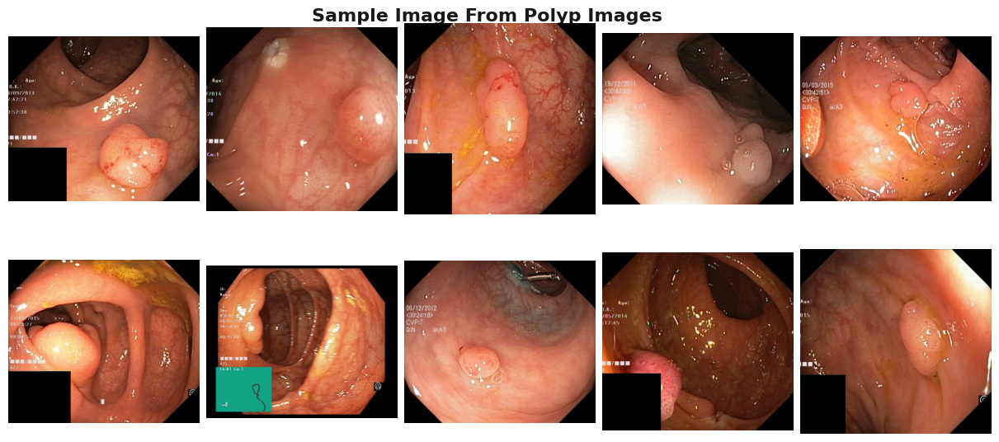

In [ ]:
fig, axs = plt.subplots(2, 5, figsize=(12, 5.4), constrained_layout=True)
fig.text(s='Sample Image From Polyp Images', size=16, fontweight='bold',
         y=0.97, x=0.31, alpha=0.9)
axs = axs.flatten()
for img, ax in zip(input.images[:10], axs):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.axis("off")
plt.show()

#### Visualize Ployps vs. Masks


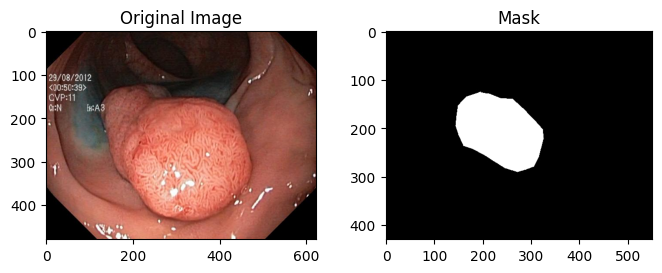

In [ ]:
plt.figure(figsize=(8, 2.7))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(input.images[10], cv2.COLOR_BGR2RGB))
plt.title("Original Image")

plt.subplot(1, 2, 2)
plt.imshow(input.masks[11], cmap='gray')
plt.title("Mask")
plt.show()

## Preparing Data


#### Split data


If you have run this code before, please execute it again to remove old directories.


In [ ]:
shutil.rmtree("/content/kvasir-seg/Kvasir-SEG/train")
shutil.rmtree("/content/kvasir-seg/Kvasir-SEG/test")
shutil.rmtree("/content/kvasir-seg/Kvasir-SEG/validation")

In this section, I aim to randomly split the input images into three parts: one for training images, where you can specify the desired volume; another for validation images, and finally, a section for testing.


In [ ]:
# Define the paths
source_dir = "/content/kvasir-seg/Kvasir-SEG"
images_dir = os.path.join(source_dir, "images")
masks_dir = os.path.join(source_dir, "masks")
output_dir = "/content/kvasir-seg/Kvasir-SEG"

# Create output folders for training, validation, and test sets
train_dir = os.path.join(output_dir, "train")
val_dir = os.path.join(output_dir, "validation")
test_dir = os.path.join(output_dir, "test")

os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Function to copy files from source to destination


def copy_files(file_list, source_folder, dest_folder):
    for file in file_list:
        shutil.copy(file, dest_folder)


# List all images and masks
images = [os.path.join(images_dir, f) for f in os.listdir(
    images_dir) if os.path.isfile(os.path.join(images_dir, f))]
masks = [os.path.join(masks_dir, f) for f in os.listdir(
    masks_dir) if os.path.isfile(os.path.join(masks_dir, f))]


temp = list(zip(images, masks))
random.shuffle(temp)
images, masks = zip(*temp)
images, masks = list(images), list(masks)

# Define ratios for train, validation, and test sets (e.g., 60%, 20%, 20%)
train_ratio = 0.8
val_ratio = 0.1
test_ratio = 0.1

# Split the data
train_split = int(len(images) * train_ratio)
val_split = int(len(images) * (train_ratio + val_ratio))

train_images = images[:train_split]
val_images = images[train_split:val_split]
test_images = images[val_split:]

train_masks = masks[:train_split]
val_masks = masks[train_split:val_split]
test_masks = masks[val_split:]

# Create subdirectories for images and masks
os.makedirs(os.path.join(train_dir, "images"), exist_ok=True)
os.makedirs(os.path.join(train_dir, "masks"), exist_ok=True)
os.makedirs(os.path.join(val_dir, "images"), exist_ok=True)
os.makedirs(os.path.join(val_dir, "masks"), exist_ok=True)
os.makedirs(os.path.join(test_dir, "images"), exist_ok=True)
os.makedirs(os.path.join(test_dir, "masks"), exist_ok=True)

# Copy images and masks to respective folders
copy_files(train_images, images_dir, os.path.join(train_dir, "images"))
copy_files(val_images, images_dir, os.path.join(val_dir, "images"))
copy_files(test_images, images_dir, os.path.join(test_dir, "images"))

copy_files(train_masks, masks_dir, os.path.join(train_dir, "masks"))
copy_files(val_masks, masks_dir, os.path.join(val_dir, "masks"))
copy_files(test_masks, masks_dir, os.path.join(test_dir, "masks"))

print("Data split and copied successfully.")

Data split and copied successfully.


#### Encode Masks


`one_hot_encode` : Converts a segmentation label map to one-hot encoded format based on the provided label values.

`reverse_one_hot` : Converts a one-hot encoded segmentation map back to a single-channel segmentation label map.

`color_code_segmentation` : Converts a single-channel segmentation label map to a color-coded segmentation map based on the provided label values.


In [ ]:
def one_hot_encode(label, label_values):
    semantic_map = []
    for color in label_values:
        equality = np.equal(label, color)
        class_map = np.all(equality, axis=-1)
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)

    return semantic_map


def reverse_one_hot(image):
    x = np.argmax(image, axis=-1)
    return x


def color_code_segmentation(image, label_values):
    color_codes = np.array(label_values)
    x = color_codes[image.astype(int)]

    return x

#### A custom PyTorch dataset


A custom PyTorch dataset class for handling image and mask data.


In [ ]:
class TorchDataset(torch.utils.data.Dataset):
    def __init__(
            self,
            df,
            class_rgb_values=None,
            augmentation=None,
            preprocessing=None,
    ):
        self.image_paths = df['image_path'].tolist()
        self.mask_paths = df['mask_path'].tolist()

        self.class_rgb_values = class_rgb_values
        self.augmentation = augmentation
        self.preprocessing = preprocessing

    def __getitem__(self, i):
        image = cv2.cvtColor(cv2.imread(
            self.image_paths[i]), cv2.COLOR_BGR2RGB)
        mask = cv2.cvtColor(cv2.imread(self.mask_paths[i]), cv2.COLOR_BGR2RGB)

        mask = one_hot_encode(mask, self.class_rgb_values).astype('float')

        # apply augmentations, you should this in init
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        # apply preprocessing, you should set it in init
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        return image, mask

    def __len__(self):
        return len(self.image_paths)

A helper function for visualizing images


In [ ]:
def visualize(**images):
    n_images = len(images)
    plt.figure(figsize=(20, 8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(name.replace('_', ' ').title())
        if (name == 'ground_truth_mask'):
            plt.imshow(image, cmap='gray')
        else:
            plt.imshow(image)

    plt.show()

#### Load Trian data


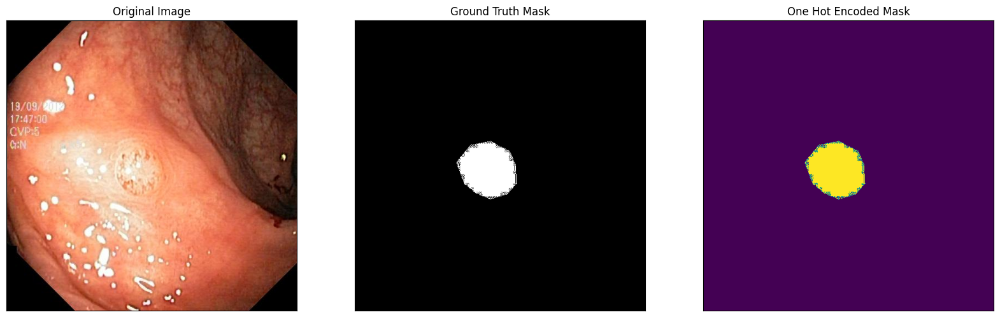

In [ ]:
dataset_root_train = '/content/kvasir-seg/Kvasir-SEG/train'

images_dir = os.path.join(dataset_root_train, 'images')
masks_dir = os.path.join(dataset_root_train, 'masks')

image_paths = [os.path.join(images_dir, filename)
               for filename in os.listdir(images_dir)]
masks_paths = [os.path.join(masks_dir, filename)
               for filename in os.listdir(masks_dir)]

df_train = pd.DataFrame({'image_path': image_paths, 'mask_path': masks_paths})

dataset = TorchDataset(df_train, class_rgb_values=(0, 255))

image, mask = dataset[1]

visualize(
    original_image=image,
    ground_truth_mask=color_code_segmentation(
        reverse_one_hot(mask), (0, 255)),
    one_hot_encoded_mask=reverse_one_hot(mask)
)

## Preprocessing


`get_training_augmentation` : Returns a set of augmentation transformations for training data.

`get_validation_augmentation` : Returns a set of augmentation transformations for validation data.

`to_tensor` : Converts an image array to a PyTorch tensor.

`get_preprocessing` : Returns a set of preprocessing transformations.


In [ ]:
def get_training_augmentation():
    train_transform = [
        album.Resize(height=512, width=608,
                     interpolation=cv2.INTER_CUBIC, always_apply=True),
        album.HorizontalFlip(p=0.5),
        album.VerticalFlip(p=0.5),
    ]
    return album.Compose(train_transform)


def get_validation_augmentation():
    test_transform = [
        album.Resize(height=512, width=608,
                     interpolation=cv2.INTER_CUBIC, always_apply=True),
    ]
    return album.Compose(test_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn=None):
    _transform = []
    if preprocessing_fn:
        _transform.append(album.Lambda(image=preprocessing_fn))
    _transform.append(album.Lambda(image=to_tensor, mask=to_tensor))

    return album.Compose(_transform)

#### Visualize processed data


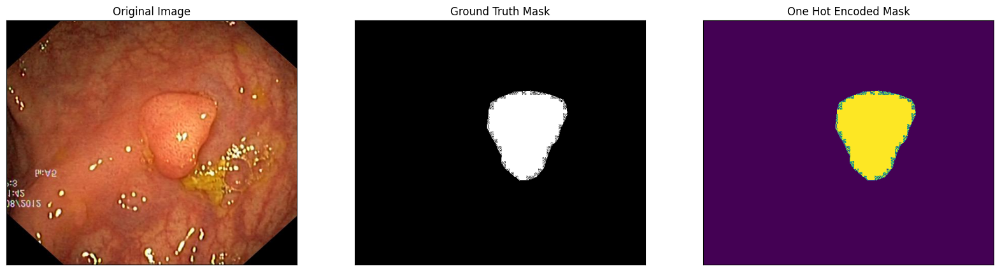

In [ ]:
augmented_dataset = TorchDataset(
    df_train,
    augmentation=get_training_augmentation(),
    class_rgb_values=(0, 255),
)

random_idx = random.randint(0, len(augmented_dataset)-1)

# Different augmentations on image/mask pairs
for idx in range(1):
    image, mask = augmented_dataset[idx]
    visualize(
        original_image=image,
        ground_truth_mask=color_code_segmentation(
            reverse_one_hot(mask), (0, 255)),
        one_hot_encoded_mask=reverse_one_hot(mask)
    )

## Models Implementations


This class serves as a foundational framework for training and evaluating various segmentation models for polyp detection.

##### Attributes

- `CLASSES`: A list defining the classes for segmentation.
- `ACTIVATION`: Activation function used in the models.
- `DATASET_VALIDATION_ROOT_DIR`: Root directory for the validation dataset.
- `DATASET_TEST_ROOT_DIR`: Root directory for the test dataset.

##### Methods

`__init__(self, model_name, model, encoder)`

- **Parameters:**
  - `model_name`: Name of the model.
  - `model`: Segmentation model.
  - `encoder`: Encoder for the model.
- **Description:** Initializes the BaseModel class with the provided parameters.

`init_model(self, encoder_weights='imagenet')`

- **Parameters:**
  - `encoder_weights`: Weights for the encoder.
- **Description:** Initializes the segmentation model.

`build_trian_and_valid_loader(self, batch_size=16)`

- **Parameters:**
  - `batch_size`: Batch size for data loading.
- **Description:** Builds training and validation data loaders.

`set_model_training_params(self, n_epoch=10)`

- **Parameters:**
  - `n_epoch`: Number of epochs for training.
- **Description:** Sets training parameters including loss, metrics, optimizer, and learning rate scheduler.

`init_train_and_valid_epoch(self)`

- **Description:** Initializes training and validation epochs.

`train(self)`

- **Description:** Trains the model.

`load_best_model(self)`

- **Description:** Loads the best-performing model.

`load_testset_and_visualize(self)`

- **Description:** Loads the test dataset and visualizes results.

`evaluation(self)`

- **Description:** Evaluates model performance on test data.

`visualize_train__loss_vs_score(self)`

- **Description:** Visualizes training loss vs. score.

`plot_iou_score_during_training(self)`

- **Description:** Plots IoU score during training.

`plot_dice_loss_during_training(self)`

- **Description:** Plots Dice loss during training.

`visualize_predicted_result(self)`

- **Description:** Visualizes predicted results.


In [ ]:
class BaseModel:

    CLASSES = ['polyp', 'background']
    ACTIVATION = 'sigmoid'

    DATASET_VALIDATION_ROOT_DIR = '/content/kvasir-seg/Kvasir-SEG/validation'
    DATASET_TEST_ROOT_DIR = '/content/kavasir-seg/Kvasir-SEG/test'

    def __init__(self, model_name, model, encoder) -> None:
        self.model = model
        self.encoder = encoder
        self.model_name = model_name

    def init_model(self, encoder_weights='imagenet'):

        self.model = self.model(
            encoder_name=self.encoder,
            encoder_weights=encoder_weights,
            classes=len(self.CLASSES),
            activation=self.ACTIVATION,
        )

        self.preprocessing_fn = smp.encoders.get_preprocessing_fn(
            self.encoder, encoder_weights)

    def build_trian_and_valid_loader(self, batch_size=16):
        # Get train and val dataset instances
        train_dataset = TorchDataset(
            df_train,
            augmentation=get_training_augmentation(),
            preprocessing=get_preprocessing(self.preprocessing_fn),
            class_rgb_values=(0, 255),
        )

        images_dir = os.path.join(self.DATASET_VALIDATION_ROOT_DIR, 'images')
        masks_dir = os.path.join(self.DATASET_VALIDATION_ROOT_DIR, 'masks')

        image_paths = [os.path.join(images_dir, filename)
                       for filename in os.listdir(images_dir)]
        masks_paths = [os.path.join(masks_dir, filename)
                       for filename in os.listdir(masks_dir)]

        df_val = pd.DataFrame(
            {'image_path': image_paths, 'mask_path': masks_paths})

        valid_dataset = TorchDataset(
            df_val,
            augmentation=get_validation_augmentation(),
            preprocessing=get_preprocessing(self.preprocessing_fn),
            class_rgb_values=(0, 255),
        )

        # Get train and val data loaders
        self.train_loader = DataLoader(
            train_dataset, batch_size=batch_size, shuffle=True)
        self.valid_loader = DataLoader(
            valid_dataset, batch_size=batch_size, shuffle=False)

    def set_model_training_params(self, n_epoch=10):
        # Set flag to train the model or not. If set to 'False', only prediction is performed (using an older model checkpoint)
        self.TRAINING = True

        # Set num of epochs
        self.EPOCHS = n_epoch

        # Set device: `cuda` or `cpu`
        self.DEVICE = torch.device(
            "cuda" if torch.cuda.is_available() else "cpu")

        # define loss function
        self.loss = smp.utils.losses.DiceLoss()

        # define metrics
        self.metrics = [
            smp.utils.metrics.IoU(threshold=0.5),
        ]

        # define optimizer
        self.optimizer = torch.optim.Adam([
            dict(params=self.model.parameters(), lr=0.0001),
        ])

        # define learning rate scheduler (not used in this NB)
        self.lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
            self.optimizer, T_0=1, T_mult=2, eta_min=5e-5,
        )

    def init_train_and_valid_epoch(self):
        self.train_epoch = TrainEpoch(
            self.model,
            loss=self.loss,
            metrics=self.metrics,
            optimizer=self.optimizer,
            device=self.DEVICE,
            verbose=True,
        )

        self.valid_epoch = ValidEpoch(
            self.model,
            loss=self.loss,
            metrics=self.metrics,
            device=self.DEVICE,
            verbose=True,
        )

    def train(self):
        start_time = timer()

        self.train_logs_list, self.valid_logs_list = [], []
        best_iou_score = 0.0

        for i in range(0, self.EPOCHS):

            # Perform training & validation
            print('\nEpoch: {}'.format(i))
            train_logs = self.train_epoch.run(self.train_loader)
            valid_logs = self.valid_epoch.run(self.valid_loader)
            self.train_logs_list.append(train_logs)
            self.valid_logs_list.append(valid_logs)

            # Save model if a better val IoU score is obtained
            if best_iou_score < valid_logs['iou_score']:
                best_iou_score = valid_logs['iou_score']
                torch.save(self.model, './' +
                           self.model_name + '_best_model.pth')
                print('Model saved!')

        print((timer() - start_time) / 60, "minuates")

    def load_best_model(self):
        self.best_model = torch.load(
            '/content/' + self.model_name + '_best_model.pth', map_location=self.DEVICE)

    def load_testset_and_visualize(self):
        images_dir = os.path.join(self.DATASET_TEST_ROOT_DIR, 'images')
        masks_dir = os.path.join(self.DATASET_TEST_ROOT_DIR, 'masks')

        image_paths = [os.path.join(images_dir, filename)
                       for filename in os.listdir(images_dir)]
        masks_paths = [os.path.join(masks_dir, filename)
                       for filename in os.listdir(masks_dir)]

        df_test = pd.DataFrame(
            {'image_path': image_paths, 'mask_path': masks_paths})

        self.test_dataset = TorchDataset(
            df_test,
            augmentation=get_validation_augmentation(),
            preprocessing=get_preprocessing(self.preprocessing_fn),
            class_rgb_values=(0, 255),
        )

        self.test_dataloader = DataLoader(self.test_dataset)

        # test dataset for visualization (without preprocessing augmentations & transformations)
        self.test_dataset_vis = TorchDataset(
            df_test,
            class_rgb_values=(0, 255),
        )

        # get a random test image/mask index
        random_idx = random.randint(0, len(self.test_dataset_vis)-1)
        image, mask = self.test_dataset_vis[random_idx]

        visualize(
            original_image=image,
            ground_truth_mask=color_code_segmentation(
                reverse_one_hot(mask), (0, 255)),
            one_hot_encoded_mask=reverse_one_hot(mask)
        )

    def evaluation(self):
        sample_preds_folder = self.model_name + '_sample_predictions/'
        if not os.path.exists(sample_preds_folder):
            os.makedirs(sample_preds_folder)

        test_epoch = smp.utils.train.ValidEpoch(
            self.model,
            loss=self.loss,
            metrics=self.metrics,
            device=self.DEVICE,
            verbose=True,
        )

        valid_logs = test_epoch.run(self.test_dataloader)
        print("Evaluation on Test Data: ")
        print(f"Mean IoU Score: {valid_logs['iou_score']:.4f}")
        print(f"Mean Dice Loss: {valid_logs['dice_loss']:.4f}")

    def visualize_train__loss_vs_score(self):
        self.train_logs_df = pd.DataFrame(self.train_logs_list)
        self.valid_logs_df = pd.DataFrame(self.valid_logs_list)
        return self.train_logs_df.T

    def plot_iou_score_during_training(self):
        plt.figure(figsize=(6, 3))
        plt.plot(self.train_logs_df.index.tolist(),
                 self.train_logs_df.iou_score.tolist(), lw=3, label='Train')
        plt.plot(self.valid_logs_df.index.tolist(),
                 self.valid_logs_df.iou_score.tolist(), lw=3, label='Valid')
        plt.xlabel('Epochs', fontsize=20)
        plt.ylabel('IoU Score', fontsize=20)
        plt.title('IoU Score Plot', fontsize=20)
        plt.legend(loc='best', fontsize=16)
        plt.grid()
        plt.savefig('iou_score_plot.png')
        plt.show()

    def plot_dice_loss_during_training(self):
        plt.figure(figsize=(6, 3))
        plt.plot(self.train_logs_df.index.tolist(),
                 self.train_logs_df.dice_loss.tolist(), lw=3, label='Train')
        plt.plot(self.valid_logs_df.index.tolist(),
                 self.valid_logs_df.dice_loss.tolist(), lw=3, label='Valid')
        plt.xlabel('Epochs', fontsize=20)
        plt.ylabel('Dice Loss', fontsize=20)
        plt.title('Dice Loss Plot', fontsize=20)
        plt.legend(loc='best', fontsize=16)
        plt.grid()
        plt.savefig('dice_loss_plot.png')
        plt.show()

    def visualize_predicted_result(self):
        n = np.random.choice(len(self.test_dataset))

        image_vis = self.test_dataset_vis[n][0].astype('uint8')
        image, gt_mask = self.test_dataset[n]

        gt_mask = gt_mask.T
        gt_mask = np.transpose(gt_mask, (1, 0, 2))
        x_tensor = torch.from_numpy(image).to(self.DEVICE).unsqueeze(0)
        pr_mask = self.best_model.predict(x_tensor)

        pr_mask = (pr_mask.squeeze().cpu().numpy().round())

        visualize(
            image=image_vis,
            ground_truth_mask=color_code_segmentation(
                reverse_one_hot(gt_mask), (0, 255)),
            predicted_mask=reverse_one_hot(np.transpose(pr_mask.T, (1, 0, 2)))
        )

### UNET


#### UNET With Resnet


In [ ]:
unet_plus_resnet = BaseModel('unet_plus_resnet', smp.Unet, 'resnet50')

In [ ]:
unet_plus_resnet.init_model()

In [ ]:
unet_plus_resnet.build_trian_and_valid_loader()

In [ ]:
unet_plus_resnet.set_model_training_params()

In [ ]:
unet_plus_resnet.init_train_and_valid_epoch()

In [ ]:
unet_plus_resnet.train()


Epoch: 0
valid: 100%|██████████| 7/7 [00:06<00:00,  1.01it/s, dice_loss - 0.3276, iou_score - 0.7512]
Model saved!

Epoch: 1
valid: 100%|██████████| 7/7 [00:07<00:00,  1.04s/it, dice_loss - 0.2862, iou_score - 0.728]

Epoch: 2
valid: 100%|██████████| 7/7 [00:06<00:00,  1.08it/s, dice_loss - 0.2386, iou_score - 0.8648]
Model saved!

Epoch: 3
valid: 100%|██████████| 7/7 [00:06<00:00,  1.07it/s, dice_loss - 0.2014, iou_score - 0.8859]
Model saved!

Epoch: 4
valid: 100%|██████████| 7/7 [00:07<00:00,  1.02s/it, dice_loss - 0.1659, iou_score - 0.9008]
Model saved!

Epoch: 5
valid: 100%|██████████| 7/7 [00:06<00:00,  1.04it/s, dice_loss - 0.1531, iou_score - 0.8817]

Epoch: 6
valid: 100%|██████████| 7/7 [00:06<00:00,  1.08it/s, dice_loss - 0.1253, iou_score - 0.8966]

Epoch: 7
valid: 100%|██████████| 7/7 [00:07<00:00,  1.01s/it, dice_loss - 0.1062, iou_score - 0.9099]
Model saved!

Epoch: 8
valid: 100%|██████████| 7/7 [00:06<00:00,  1.08it/s, dice_loss - 0.106, iou_score - 0.8922]

Epoch: 9


In [ ]:
unet_plus_resnet.load_best_model()

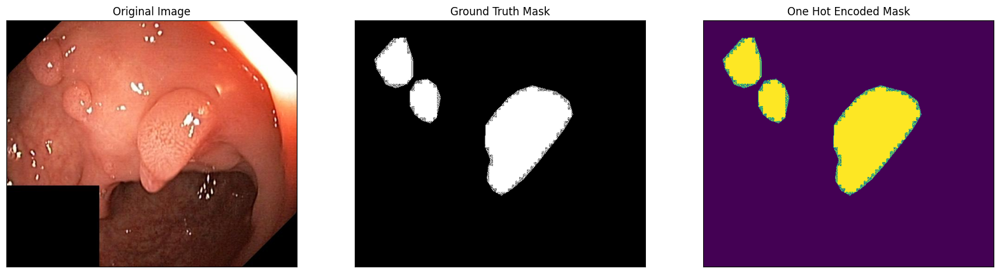

In [ ]:
unet_plus_resnet.load_testset_and_visualize()

In [ ]:
unet_plus_resnet.evaluation()

valid: 100%|██████████| 100/100 [00:08<00:00, 12.15it/s, dice_loss - 0.08365, iou_score - 0.9261]
Evaluation on Test Data: 
Mean IoU Score: 0.9261
Mean Dice Loss: 0.0837


In [ ]:
res = unet_plus_resnet.visualize_train__loss_vs_score()
res

,0,1,2,3,4,5,6,7,8,9
dice_loss,0.388293,0.311425,0.261836,0.214026,0.174229,0.149150,0.122535,0.102428,0.088490,0.078280
iou_score,0.605526,0.715806,0.754441,0.891453,0.918630,0.913681,0.927402,0.936387,0.941345,0.941434


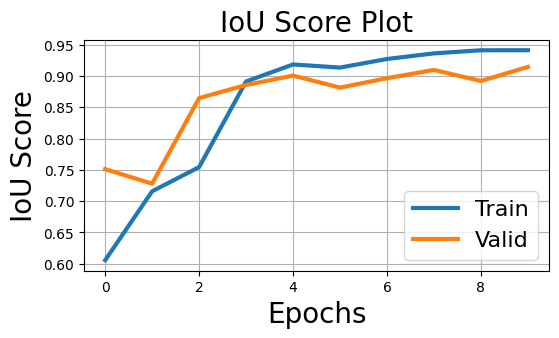

In [ ]:
unet_plus_resnet.plot_iou_score_during_training()

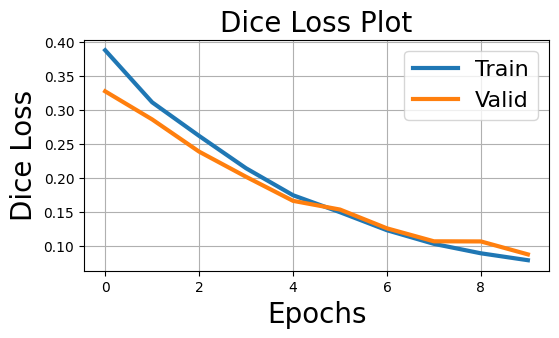

In [ ]:
unet_plus_resnet.plot_dice_loss_during_training()

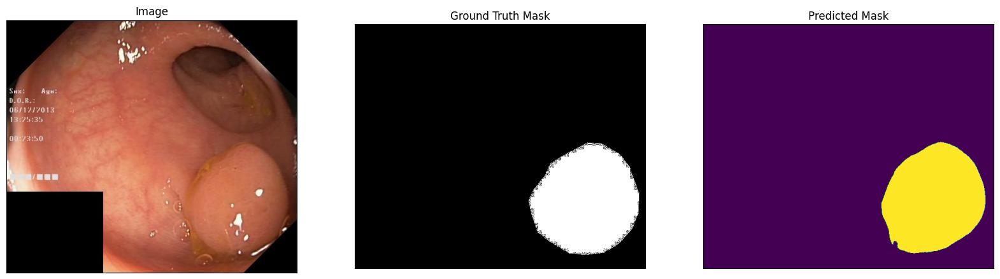

In [ ]:
unet_plus_resnet.visualize_predicted_result()

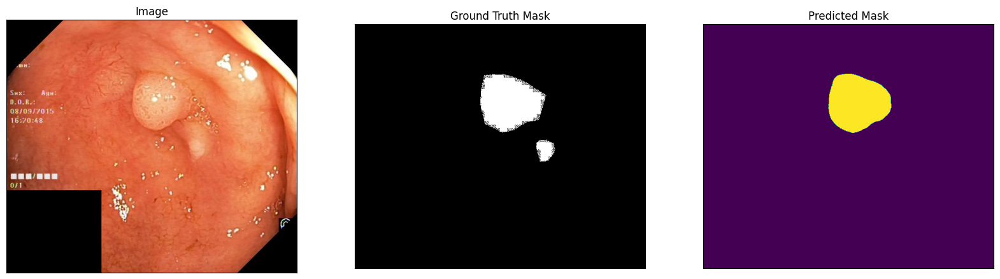

In [ ]:
unet_plus_resnet.visualize_predicted_result()

#### UNET Wth MobileNet


In [ ]:
unet_plus_MBNet = BaseModel('unet_plus_MBNet', smp.Unet, 'mobilenet_v2')

In [ ]:
unet_plus_MBNet.init_model()

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 96.2MB/s]


In [ ]:
unet_plus_MBNet.build_trian_and_valid_loader()

In [ ]:
unet_plus_MBNet.set_model_training_params()

In [ ]:
unet_plus_MBNet.init_train_and_valid_epoch()

In [ ]:
unet_plus_MBNet.train()


Epoch: 0
valid: 100%|██████████| 7/7 [00:11<00:00,  1.62s/it, dice_loss - 0.3395, iou_score - 0.703]
Model saved!

Epoch: 1
valid: 100%|██████████| 7/7 [00:07<00:00,  1.12s/it, dice_loss - 0.2904, iou_score - 0.8094]
Model saved!

Epoch: 2
valid: 100%|██████████| 7/7 [00:10<00:00,  1.52s/it, dice_loss - 0.2594, iou_score - 0.8662]
Model saved!

Epoch: 3
valid: 100%|██████████| 7/7 [00:05<00:00,  1.35it/s, dice_loss - 0.233, iou_score - 0.882]
Model saved!

Epoch: 4
valid: 100%|██████████| 7/7 [00:07<00:00,  1.05s/it, dice_loss - 0.2087, iou_score - 0.8703]

Epoch: 5
valid: 100%|██████████| 7/7 [00:08<00:00,  1.25s/it, dice_loss - 0.1819, iou_score - 0.8747]

Epoch: 6
valid: 100%|██████████| 7/7 [00:05<00:00,  1.34it/s, dice_loss - 0.1567, iou_score - 0.8808]

Epoch: 7
valid: 100%|██████████| 7/7 [00:05<00:00,  1.17it/s, dice_loss - 0.1314, iou_score - 0.8804]

Epoch: 8
valid: 100%|██████████| 7/7 [00:05<00:00,  1.35it/s, dice_loss - 0.1177, iou_score - 0.8821]
Model saved!

Epoch: 9
v

In [ ]:
unet_plus_MBNet.load_best_model()

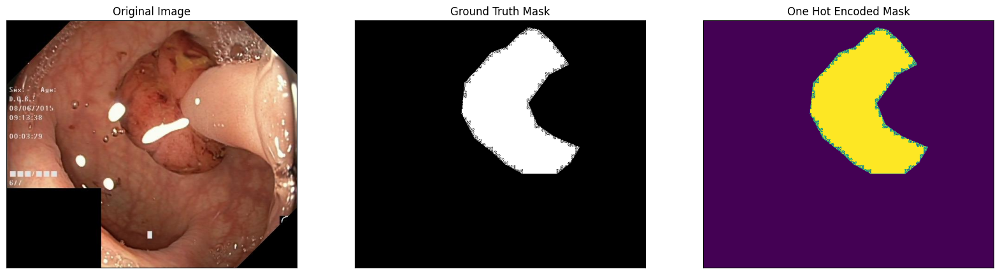

In [ ]:
unet_plus_MBNet.load_testset_and_visualize()

In [ ]:
unet_plus_MBNet.evaluation()

valid: 100%|██████████| 100/100 [00:06<00:00, 15.55it/s, dice_loss - 0.1028, iou_score - 0.9012]
Evaluation on Test Data: 
Mean IoU Score: 0.9012
Mean Dice Loss: 0.1028


In [ ]:
res = unet_plus_MBNet.visualize_train__loss_vs_score()
res

,0,1,2,3,4,5,6,7,8,9
dice_loss,0.410321,0.314927,0.274954,0.242913,0.212885,0.181370,0.152837,0.121458,0.099097,0.086679
iou_score,0.592353,0.726042,0.870813,0.903806,0.916535,0.921613,0.928139,0.932794,0.937433,0.937603


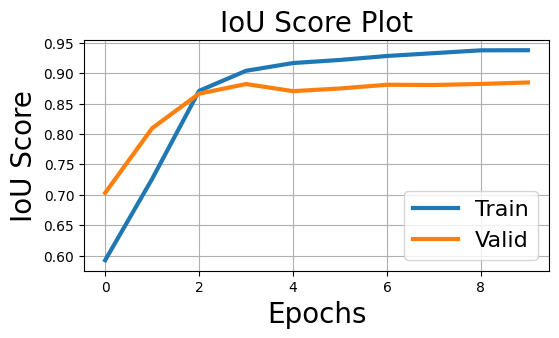

In [ ]:
unet_plus_MBNet.plot_iou_score_during_training()

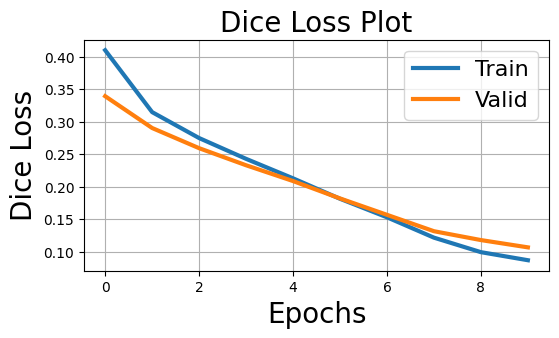

In [ ]:
unet_plus_MBNet.plot_dice_loss_during_training()

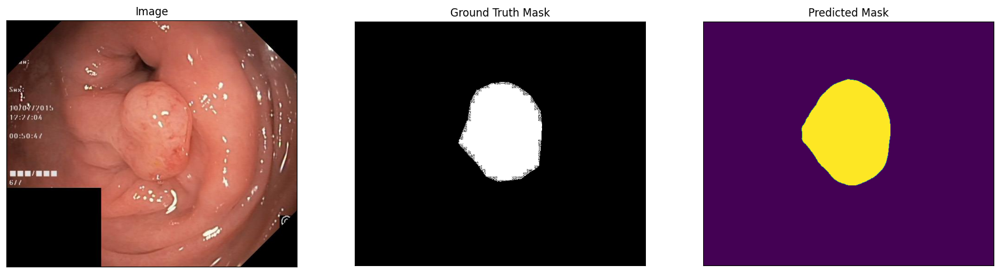

In [ ]:
unet_plus_MBNet.visualize_predicted_result()

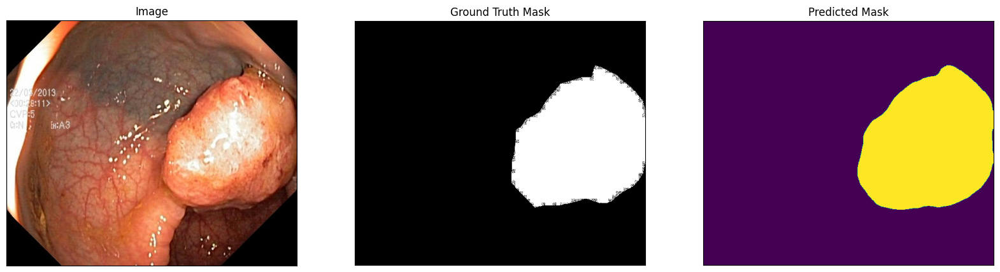

In [ ]:
unet_plus_MBNet.visualize_predicted_result()

### UNET++


#### UNET++ With Resnet


In [ ]:
unet_plus_plus_plus_resnet = BaseModel(
    'unet_plus_plus_plus_resnet', smp.UnetPlusPlus, 'resnet50')

In [ ]:
unet_plus_plus_plus_resnet.init_model()

In [ ]:
unet_plus_plus_plus_resnet.build_trian_and_valid_loader(batch_size=4)

In [ ]:
unet_plus_plus_plus_resnet.set_model_training_params(n_epoch=7)

In [ ]:
unet_plus_plus_plus_resnet.init_train_and_valid_epoch()

In [ ]:
unet_plus_plus_plus_resnet.train()


Epoch: 0
valid: 100%|██████████| 25/25 [00:16<00:00,  1.51it/s, dice_loss - 0.1997, iou_score - 0.8786]
Model saved!

Epoch: 1
valid: 100%|██████████| 25/25 [00:16<00:00,  1.52it/s, dice_loss - 0.142, iou_score - 0.8501]

Epoch: 2
valid: 100%|██████████| 25/25 [00:17<00:00,  1.44it/s, dice_loss - 0.09511, iou_score - 0.8859]
Model saved!

Epoch: 3
valid: 100%|██████████| 25/25 [00:15<00:00,  1.57it/s, dice_loss - 0.07916, iou_score - 0.8884]
Model saved!

Epoch: 4
valid: 100%|██████████| 25/25 [00:16<00:00,  1.55it/s, dice_loss - 0.06186, iou_score - 0.9086]
Model saved!

Epoch: 5
valid: 100%|██████████| 25/25 [00:16<00:00,  1.55it/s, dice_loss - 0.06704, iou_score - 0.8914]

Epoch: 6
valid: 100%|██████████| 25/25 [00:16<00:00,  1.56it/s, dice_loss - 0.05028, iou_score - 0.9181]
Model saved!
39.46096916558333 minuates


In [ ]:
unet_plus_plus_plus_resnet.load_best_model()

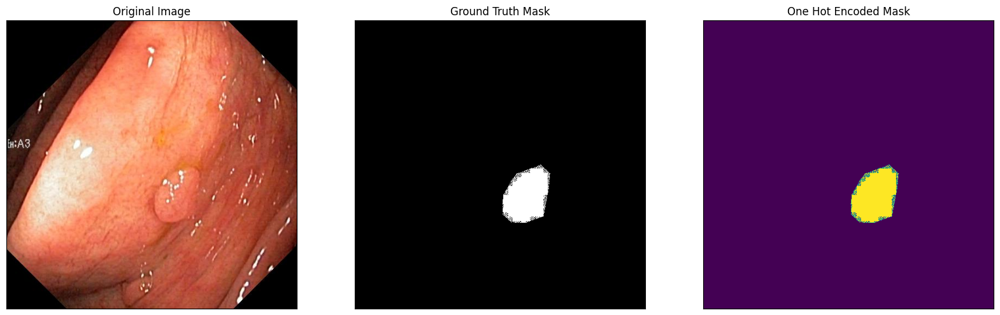

In [ ]:
unet_plus_plus_plus_resnet.load_testset_and_visualize()

In [ ]:
unet_plus_plus_plus_resnet.evaluation()

valid: 100%|██████████| 100/100 [00:15<00:00,  6.31it/s, dice_loss - 0.0505, iou_score - 0.9229]
Evaluation on Test Data: 
Mean IoU Score: 0.9229
Mean Dice Loss: 0.0505


In [ ]:
res = unet_plus_plus_plus_resnet.visualize_train__loss_vs_score()
res

,0,1,2,3,4,5,6
dice_loss,0.289607,0.160843,0.109394,0.087818,0.073204,0.060758,0.059436
iou_score,0.792307,0.881336,0.886614,0.888862,0.896776,0.909520,0.906165


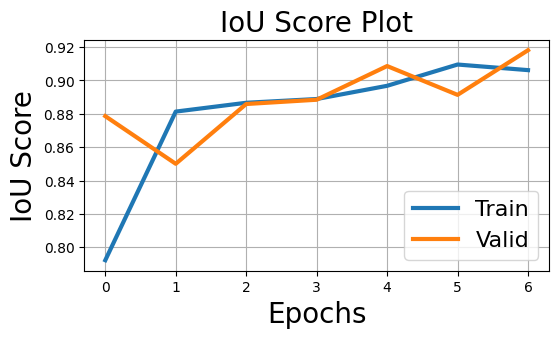

In [ ]:
unet_plus_plus_plus_resnet.plot_iou_score_during_training()

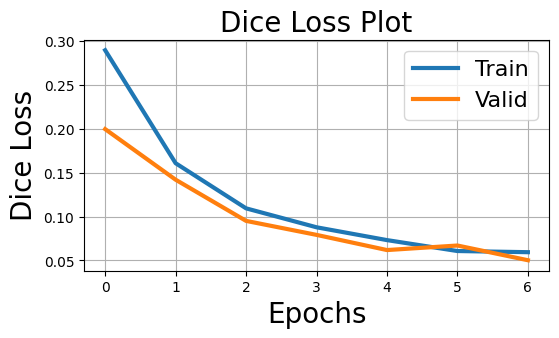

In [ ]:
unet_plus_plus_plus_resnet.plot_dice_loss_during_training()

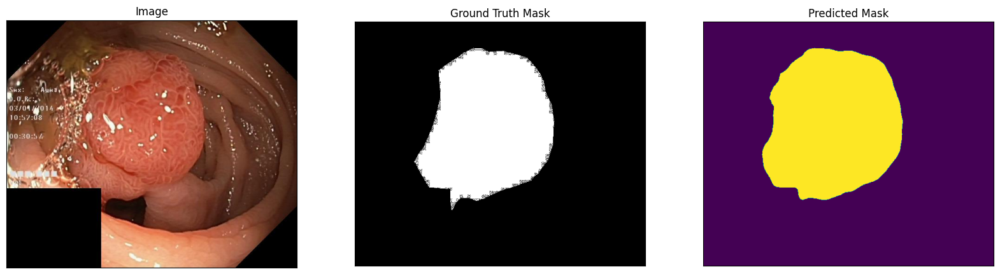

In [ ]:
unet_plus_plus_plus_resnet.visualize_predicted_result()

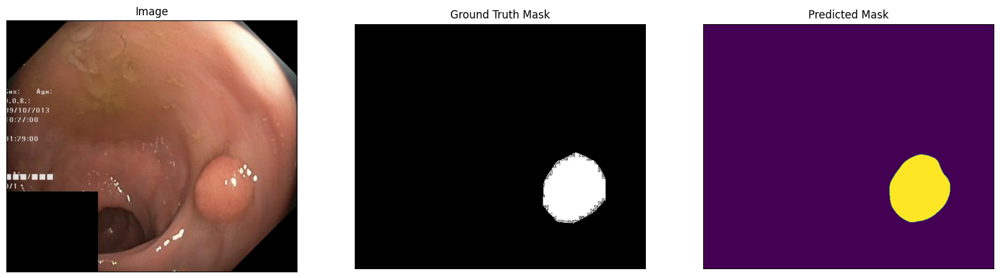

In [ ]:
unet_plus_plus_plus_resnet.visualize_predicted_result()

#### Unet++ with MobileNet


In [ ]:
unet_plus_plus_plus_MBNet = BaseModel(
    'unet_plus_plus_plus_MBNet', smp.UnetPlusPlus, 'mobilenet_v2')

In [ ]:
unet_plus_plus_plus_MBNet.init_model()

In [ ]:
unet_plus_plus_plus_MBNet.build_trian_and_valid_loader(batch_size=4)

In [ ]:
unet_plus_plus_plus_MBNet.set_model_training_params(n_epoch=7)

In [ ]:
unet_plus_plus_plus_MBNet.init_train_and_valid_epoch()

In [ ]:
unet_plus_plus_plus_MBNet.train()


Epoch: 0
valid: 100%|██████████| 25/25 [00:06<00:00,  4.05it/s, dice_loss - 0.2288, iou_score - 0.8181]
Model saved!

Epoch: 1
valid: 100%|██████████| 25/25 [00:05<00:00,  4.52it/s, dice_loss - 0.1251, iou_score - 0.8756]
Model saved!

Epoch: 2
valid: 100%|██████████| 25/25 [00:05<00:00,  4.57it/s, dice_loss - 0.08868, iou_score - 0.8958]
Model saved!

Epoch: 3
valid: 100%|██████████| 25/25 [00:06<00:00,  4.04it/s, dice_loss - 0.07525, iou_score - 0.8941]

Epoch: 4
valid: 100%|██████████| 25/25 [00:06<00:00,  3.93it/s, dice_loss - 0.0696, iou_score - 0.8925]

Epoch: 5
valid: 100%|██████████| 25/25 [00:05<00:00,  4.55it/s, dice_loss - 0.07219, iou_score - 0.8835]

Epoch: 6
valid: 100%|██████████| 25/25 [00:05<00:00,  4.26it/s, dice_loss - 0.06014, iou_score - 0.8997]
Model saved!
11.99393845508333 minuates


In [ ]:
unet_plus_plus_plus_MBNet.load_best_model()

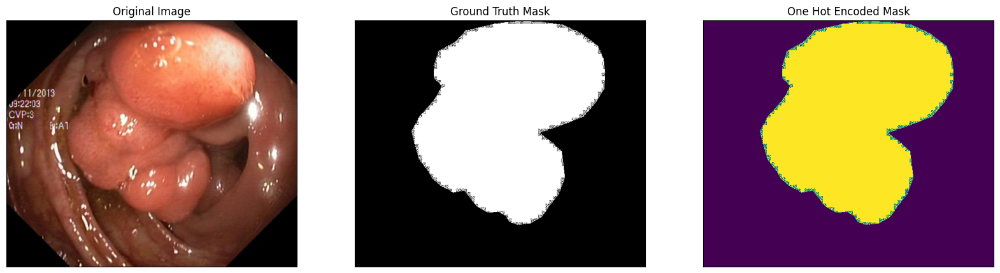

In [ ]:
unet_plus_plus_plus_MBNet.load_testset_and_visualize()

In [ ]:
unet_plus_plus_plus_MBNet.evaluation()

valid: 100%|██████████| 100/100 [00:06<00:00, 14.76it/s, dice_loss - 0.05815, iou_score - 0.9086]
Evaluation on Test Data: 
Mean IoU Score: 0.9086
Mean Dice Loss: 0.0582


In [ ]:
res = unet_plus_plus_plus_MBNet.visualize_train__loss_vs_score()
res

,0,1,2,3,4,5,6
dice_loss,0.313166,0.159210,0.096678,0.070756,0.057792,0.052288,0.045576
iou_score,0.775229,0.880075,0.903375,0.914881,0.922188,0.923219,0.929522


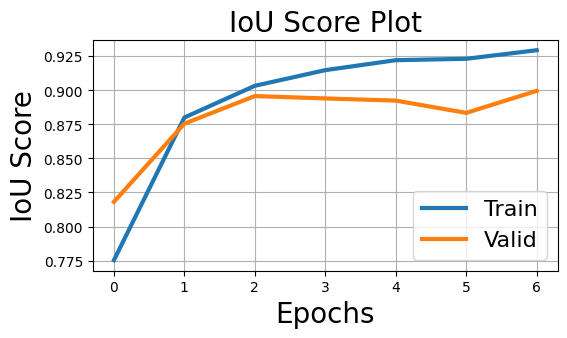

In [ ]:
unet_plus_plus_plus_MBNet.plot_iou_score_during_training()

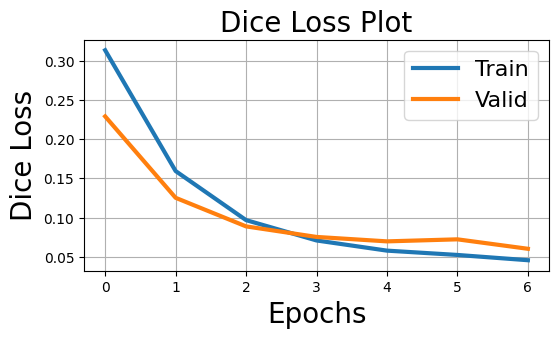

In [ ]:
unet_plus_plus_plus_MBNet.plot_dice_loss_during_training()

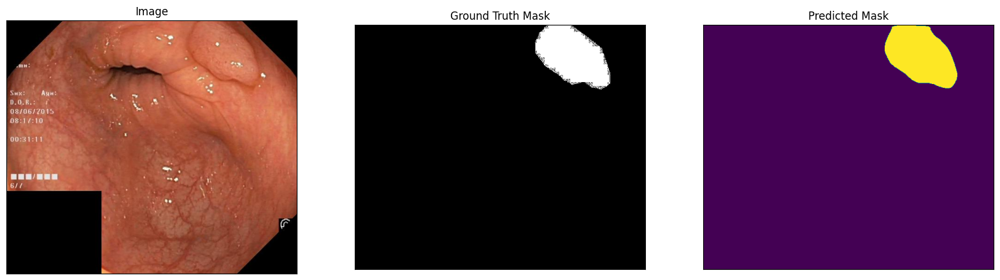

In [ ]:
unet_plus_plus_plus_MBNet.visualize_predicted_result()

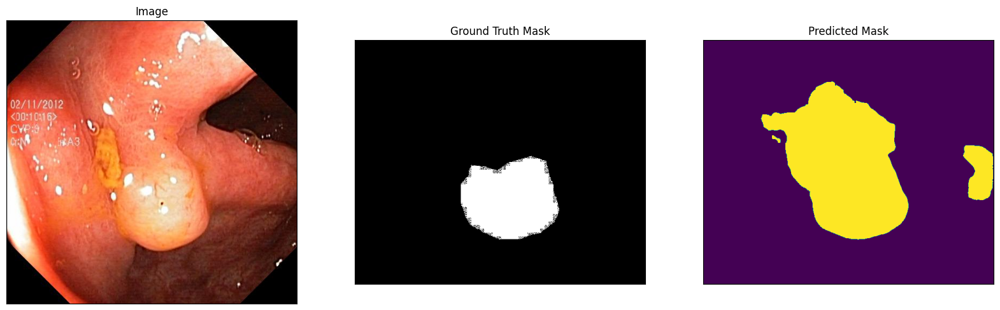

In [ ]:
unet_plus_plus_plus_MBNet.visualize_predicted_result()

### PSPNet


#### PSPNet With Resnet


In [ ]:
pspnet_plus_resnet = BaseModel('pspnet_plus_resnet', smp.PSPNet, 'resnet50')

In [ ]:
pspnet_plus_resnet.init_model()

In [ ]:
pspnet_plus_resnet.build_trian_and_valid_loader()

In [ ]:
pspnet_plus_resnet.set_model_training_params()

In [ ]:
pspnet_plus_resnet.init_train_and_valid_epoch()

In [ ]:
pspnet_plus_resnet.train()


Epoch: 0
valid: 100%|██████████| 7/7 [00:06<00:00,  1.15it/s, dice_loss - 0.1651, iou_score - 0.7549]
Model saved!

Epoch: 1
valid: 100%|██████████| 7/7 [00:05<00:00,  1.27it/s, dice_loss - 0.1177, iou_score - 0.8107]
Model saved!

Epoch: 2
valid: 100%|██████████| 7/7 [00:05<00:00,  1.37it/s, dice_loss - 0.1127, iou_score - 0.8201]
Model saved!

Epoch: 3
valid: 100%|██████████| 7/7 [00:05<00:00,  1.18it/s, dice_loss - 0.1001, iou_score - 0.834]
Model saved!

Epoch: 4
valid: 100%|██████████| 7/7 [00:05<00:00,  1.40it/s, dice_loss - 0.1259, iou_score - 0.7781]

Epoch: 5
valid: 100%|██████████| 7/7 [00:05<00:00,  1.39it/s, dice_loss - 0.1034, iou_score - 0.8188]

Epoch: 6
valid: 100%|██████████| 7/7 [00:08<00:00,  1.25s/it, dice_loss - 0.09995, iou_score - 0.8252]

Epoch: 7
valid: 100%|██████████| 7/7 [00:05<00:00,  1.35it/s, dice_loss - 0.09351, iou_score - 0.8405]
Model saved!

Epoch: 8
valid: 100%|██████████| 7/7 [00:05<00:00,  1.30it/s, dice_loss - 0.08449, iou_score - 0.8567]
Model 

In [ ]:
pspnet_plus_resnet.load_best_model()

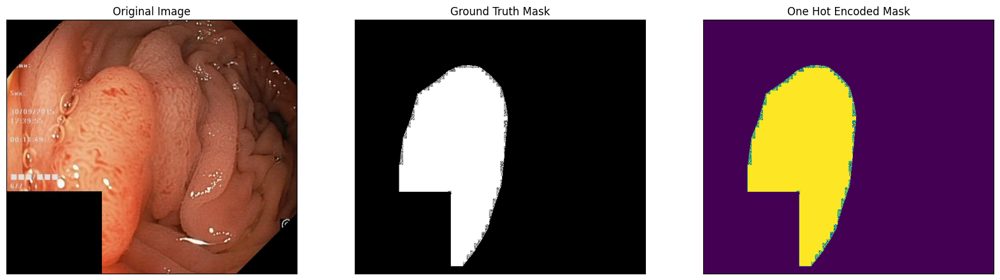

In [ ]:
pspnet_plus_resnet.load_testset_and_visualize()

In [ ]:
pspnet_plus_resnet.evaluation()

valid: 100%|██████████| 100/100 [00:05<00:00, 16.86it/s, dice_loss - 0.08134, iou_score - 0.8652]
Evaluation on Test Data: 
Mean IoU Score: 0.8652
Mean Dice Loss: 0.0813


In [ ]:
res = pspnet_plus_resnet.visualize_train__loss_vs_score()
res

,0,1,2,3,4,5,6,7,8,9
dice_loss,0.230461,0.125670,0.105141,0.097503,0.088163,0.083724,0.081680,0.076303,0.071386,0.069727
iou_score,0.679551,0.793929,0.826873,0.836992,0.851267,0.857598,0.859732,0.868836,0.876335,0.878504


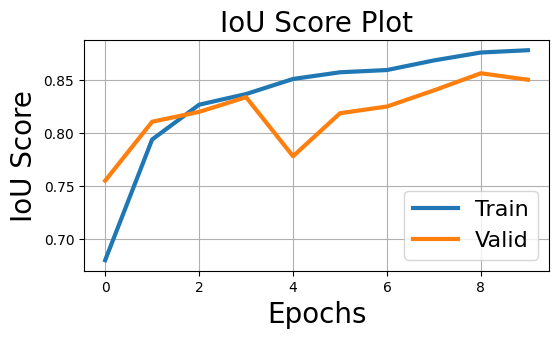

In [ ]:
pspnet_plus_resnet.plot_iou_score_during_training()

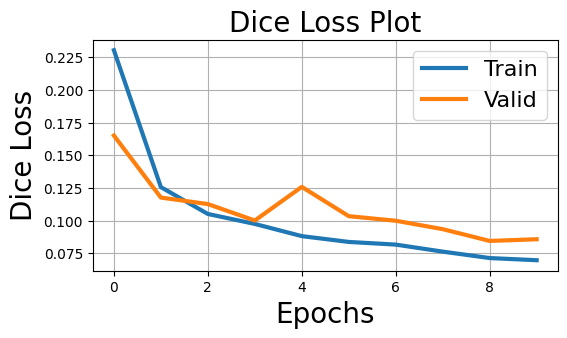

In [ ]:
pspnet_plus_resnet.plot_dice_loss_during_training()

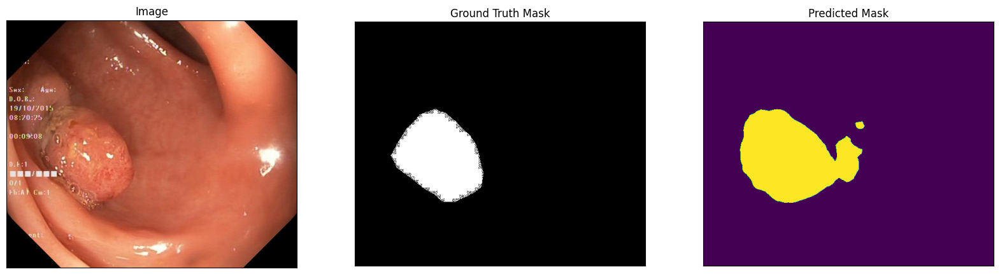

In [ ]:
pspnet_plus_resnet.visualize_predicted_result()

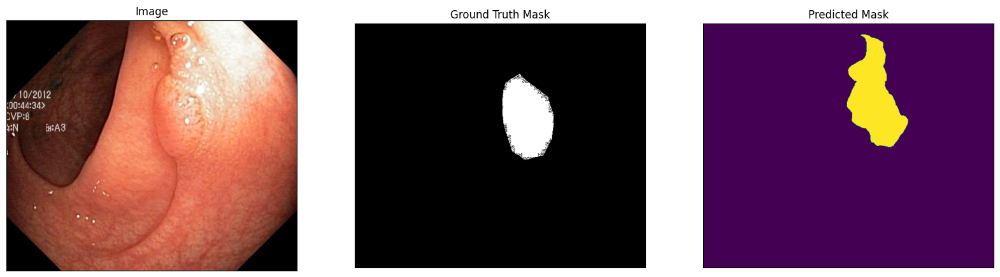

In [ ]:
pspnet_plus_resnet.visualize_predicted_result()

#### PSPNet With MobileNet


In [ ]:
pspnet_plus_MBNET = BaseModel('pspnet_plus_MBNET', smp.PSPNet, 'mobilenet_v2')

In [ ]:
pspnet_plus_MBNET.init_model()

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 81.2MB/s]


In [ ]:
pspnet_plus_MBNET.build_trian_and_valid_loader()

In [ ]:
pspnet_plus_MBNET.set_model_training_params()

In [ ]:
pspnet_plus_MBNET.init_train_and_valid_epoch()

In [ ]:
pspnet_plus_MBNET.train()


Epoch: 0
valid: 100%|██████████| 7/7 [00:04<00:00,  1.51it/s, dice_loss - 0.1557, iou_score - 0.7426]
Model saved!

Epoch: 1
valid: 100%|██████████| 7/7 [00:05<00:00,  1.39it/s, dice_loss - 0.1507, iou_score - 0.7426]

Epoch: 2
valid: 100%|██████████| 7/7 [00:04<00:00,  1.57it/s, dice_loss - 0.1495, iou_score - 0.7426]

Epoch: 3
valid: 100%|██████████| 7/7 [00:04<00:00,  1.69it/s, dice_loss - 0.149, iou_score - 0.7426]

Epoch: 4
valid: 100%|██████████| 7/7 [00:04<00:00,  1.67it/s, dice_loss - 0.1487, iou_score - 0.7426]

Epoch: 5
valid: 100%|██████████| 7/7 [00:04<00:00,  1.54it/s, dice_loss - 0.1485, iou_score - 0.7426]

Epoch: 6
valid: 100%|██████████| 7/7 [00:05<00:00,  1.36it/s, dice_loss - 0.1484, iou_score - 0.7426]

Epoch: 7
valid: 100%|██████████| 7/7 [00:04<00:00,  1.65it/s, dice_loss - 0.1483, iou_score - 0.7426]

Epoch: 8
valid: 100%|██████████| 7/7 [00:04<00:00,  1.67it/s, dice_loss - 0.1483, iou_score - 0.7426]

Epoch: 9
valid: 100%|██████████| 7/7 [00:04<00:00,  1.69it/s

In [ ]:
pspnet_plus_MBNET.load_best_model()

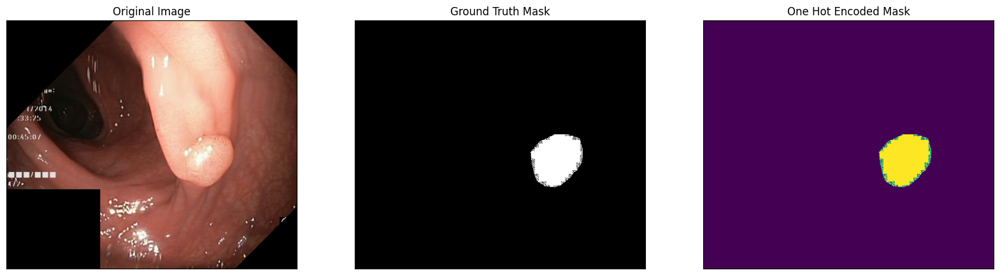

In [ ]:
pspnet_plus_MBNET.load_testset_and_visualize()

In [ ]:
pspnet_plus_MBNET.evaluation()

valid: 100%|██████████| 100/100 [00:05<00:00, 19.21it/s, dice_loss - 0.1414, iou_score - 0.7686]
Evaluation on Test Data: 
Mean IoU Score: 0.7686
Mean Dice Loss: 0.1414


In [ ]:
res = pspnet_plus_MBNET.visualize_train__loss_vs_score()
res

,0,1,2,3,4,5,6,7,8,9
dice_loss,0.249818,0.161383,0.159389,0.158642,0.158236,0.157985,0.157840,0.157735,0.157654,0.157590
iou_score,0.660584,0.729806,0.729600,0.729581,0.729730,0.729703,0.729289,0.729758,0.729523,0.729627


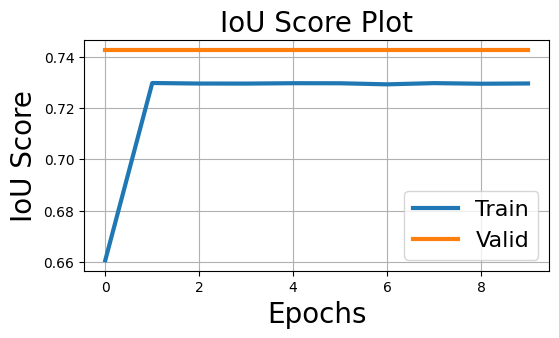

In [ ]:
pspnet_plus_MBNET.plot_iou_score_during_training()

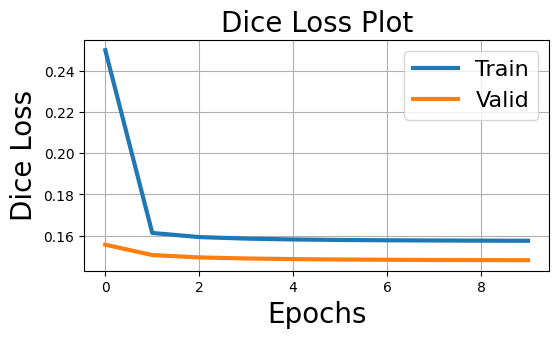

In [ ]:
pspnet_plus_MBNET.plot_dice_loss_during_training()

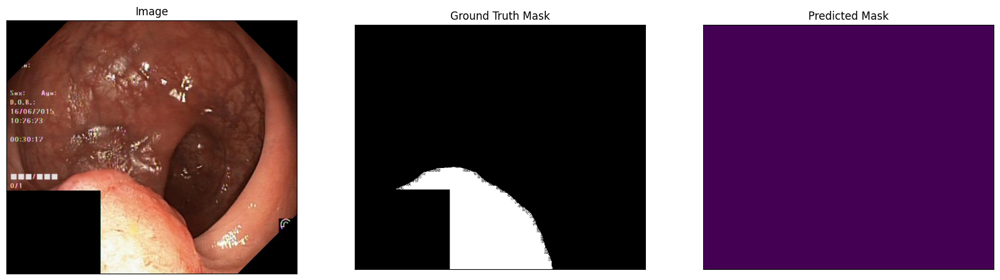

In [ ]:
pspnet_plus_MBNET.visualize_predicted_result()

### 4. DeepLabV3Plus


#### DeepLabV3Plus with ResNet


In [ ]:
dlv3p_plus_resnet = BaseModel(
    'dlv3p_plus_resnet', smp.DeepLabV3Plus, 'resnet50')

In [ ]:
dlv3p_plus_resnet.init_model()

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 92.3MB/s]


In [ ]:
dlv3p_plus_resnet.build_trian_and_valid_loader()

In [ ]:
dlv3p_plus_resnet.set_model_training_params()

In [ ]:
dlv3p_plus_resnet.init_train_and_valid_epoch()

In [ ]:
dlv3p_plus_resnet.train()


Epoch: 0
valid: 100%|██████████| 7/7 [00:07<00:00,  1.06s/it, dice_loss - 0.2387, iou_score - 0.844]
Model saved!

Epoch: 1
valid: 100%|██████████| 7/7 [00:06<00:00,  1.03it/s, dice_loss - 0.158, iou_score - 0.8948]
Model saved!

Epoch: 2
valid: 100%|██████████| 7/7 [00:07<00:00,  1.06s/it, dice_loss - 0.108, iou_score - 0.9199]
Model saved!

Epoch: 3
valid: 100%|██████████| 7/7 [00:07<00:00,  1.04s/it, dice_loss - 0.09665, iou_score - 0.9088]

Epoch: 4
valid: 100%|██████████| 7/7 [00:06<00:00,  1.02it/s, dice_loss - 0.1016, iou_score - 0.8791]

Epoch: 5
valid: 100%|██████████| 7/7 [00:07<00:00,  1.06s/it, dice_loss - 0.07505, iou_score - 0.9192]

Epoch: 6
valid: 100%|██████████| 7/7 [00:06<00:00,  1.04it/s, dice_loss - 0.0597, iou_score - 0.9358]
Model saved!

Epoch: 7
valid: 100%|██████████| 7/7 [00:07<00:00,  1.06s/it, dice_loss - 0.05989, iou_score - 0.9261]

Epoch: 8
valid: 100%|██████████| 7/7 [00:07<00:00,  1.07s/it, dice_loss - 0.05292, iou_score - 0.9316]

Epoch: 9
valid: 100

In [ ]:
dlv3p_plus_resnet.load_best_model()

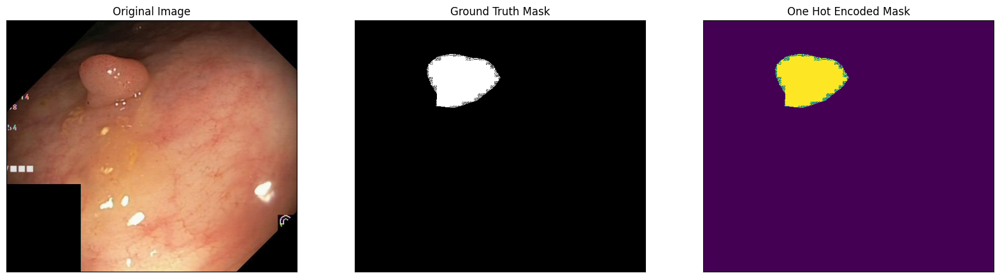

In [ ]:
dlv3p_plus_resnet.load_testset_and_visualize()

In [ ]:
dlv3p_plus_resnet.evaluation()

valid: 100%|██████████| 100/100 [00:06<00:00, 14.74it/s, dice_loss - 0.06838, iou_score - 0.9064]
Evaluation on Test Data: 
Mean IoU Score: 0.9064
Mean Dice Loss: 0.0684


In [ ]:
res = dlv3p_plus_resnet.visualize_train__loss_vs_score()
res

,0,1,2,3,4,5,6,7,8,9
dice_loss,0.337487,0.194552,0.140126,0.103007,0.085679,0.074159,0.062554,0.052387,0.048037,0.043954
iou_score,0.678001,0.867494,0.904688,0.924107,0.925741,0.926854,0.935404,0.944849,0.945775,0.947651


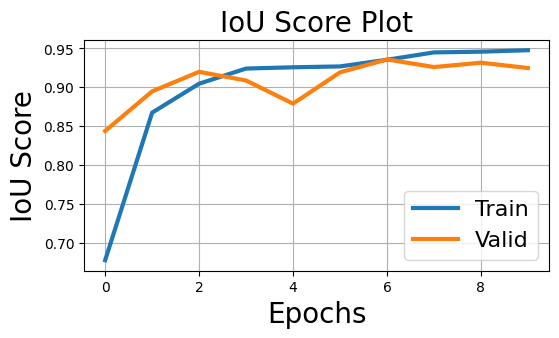

In [ ]:
dlv3p_plus_resnet.plot_iou_score_during_training()

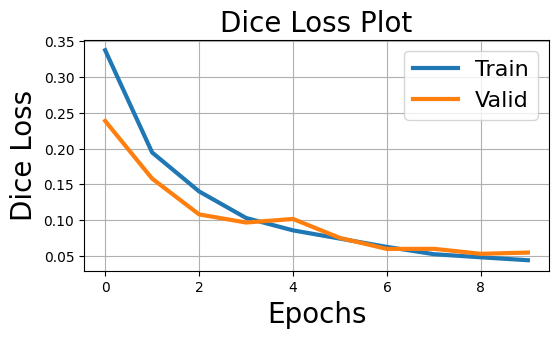

In [ ]:
dlv3p_plus_resnet.plot_dice_loss_during_training()

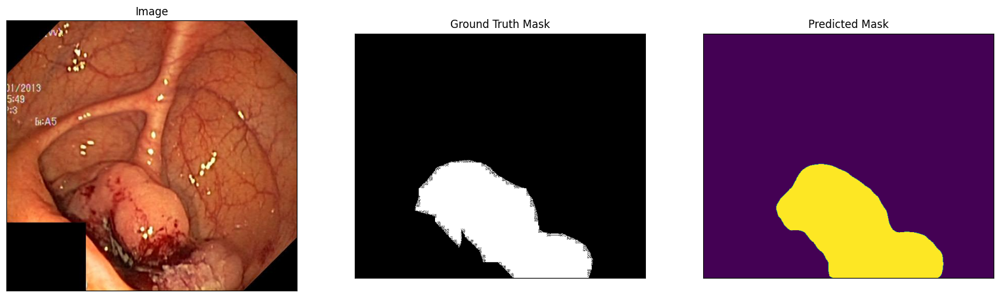

In [ ]:
dlv3p_plus_resnet.visualize_predicted_result()

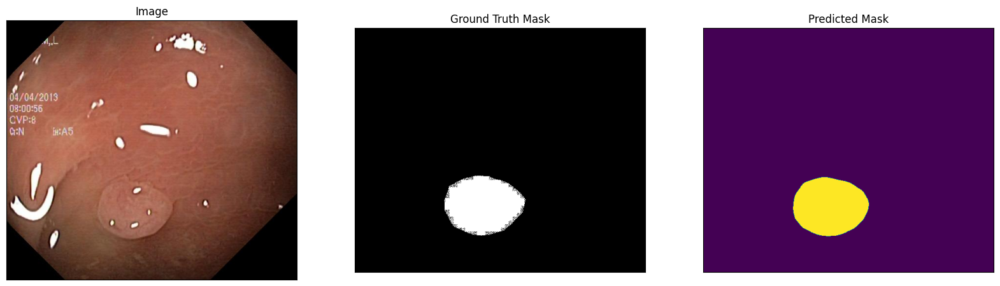

In [ ]:
dlv3p_plus_resnet.visualize_predicted_result()

#### DeepLabV3Plus With MobileNet


In [ ]:
dlv3p_plus_MBNet = BaseModel(
    'dlv3p_plus_MBNet', smp.DeepLabV3Plus, 'mobilenet_v2')

In [ ]:
dlv3p_plus_MBNet.init_model()

In [ ]:
dlv3p_plus_MBNet.build_trian_and_valid_loader()

In [ ]:
dlv3p_plus_MBNet.set_model_training_params()

In [ ]:
dlv3p_plus_MBNet.init_train_and_valid_epoch()

In [ ]:
dlv3p_plus_MBNet.train()


Epoch: 0
valid: 100%|██████████| 7/7 [00:05<00:00,  1.27it/s, dice_loss - 0.295, iou_score - 0.748]
Model saved!

Epoch: 1
valid: 100%|██████████| 7/7 [00:05<00:00,  1.28it/s, dice_loss - 0.1873, iou_score - 0.8663]
Model saved!

Epoch: 2
valid: 100%|██████████| 7/7 [00:05<00:00,  1.20it/s, dice_loss - 0.1396, iou_score - 0.891]
Model saved!

Epoch: 3
valid: 100%|██████████| 7/7 [00:05<00:00,  1.20it/s, dice_loss - 0.1111, iou_score - 0.9034]
Model saved!

Epoch: 4
valid: 100%|██████████| 7/7 [00:05<00:00,  1.34it/s, dice_loss - 0.09476, iou_score - 0.9055]
Model saved!

Epoch: 5
valid: 100%|██████████| 7/7 [00:04<00:00,  1.43it/s, dice_loss - 0.08194, iou_score - 0.9123]
Model saved!

Epoch: 6
valid: 100%|██████████| 7/7 [00:04<00:00,  1.44it/s, dice_loss - 0.07229, iou_score - 0.9173]
Model saved!

Epoch: 7
valid: 100%|██████████| 7/7 [00:05<00:00,  1.36it/s, dice_loss - 0.07307, iou_score - 0.9061]

Epoch: 8
valid: 100%|██████████| 7/7 [00:05<00:00,  1.21it/s, dice_loss - 0.06467, 

In [ ]:
dlv3p_plus_MBNet.load_best_model()

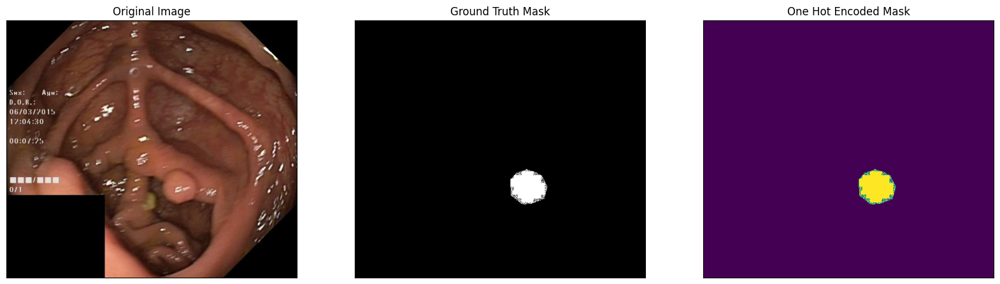

In [ ]:
dlv3p_plus_MBNet.load_testset_and_visualize()

In [ ]:
dlv3p_plus_MBNet.evaluation()

valid: 100%|██████████| 100/100 [00:06<00:00, 16.45it/s, dice_loss - 0.05712, iou_score - 0.9264]
Evaluation on Test Data: 
Mean IoU Score: 0.9264
Mean Dice Loss: 0.0571


In [ ]:
res = dlv3p_plus_MBNet.visualize_train__loss_vs_score()
res

,0,1,2,3,4,5,6,7,8,9
dice_loss,0.364783,0.210979,0.155667,0.119404,0.095234,0.080705,0.067871,0.059184,0.054586,0.048702
iou_score,0.622262,0.845379,0.888318,0.906692,0.917261,0.921290,0.930992,0.936057,0.937227,0.942111


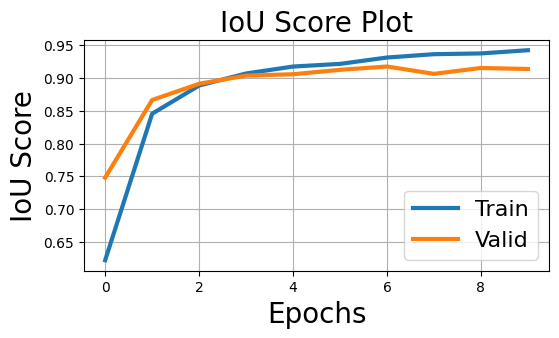

In [ ]:
dlv3p_plus_MBNet.plot_iou_score_during_training()

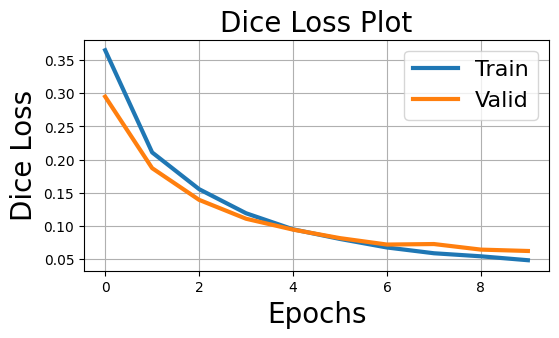

In [ ]:
dlv3p_plus_MBNet.plot_dice_loss_during_training()

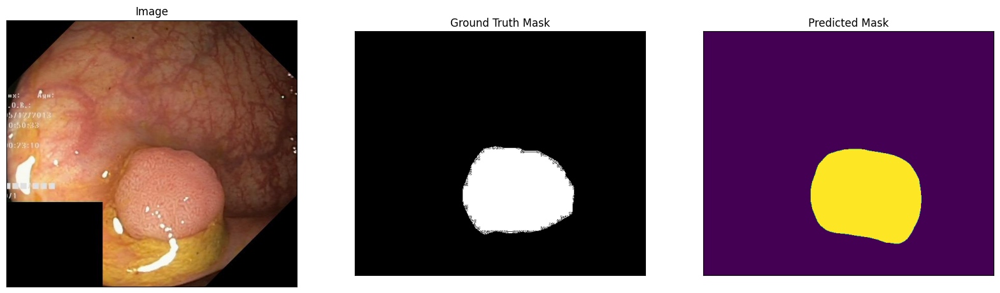

In [ ]:
dlv3p_plus_MBNet.visualize_predicted_result()

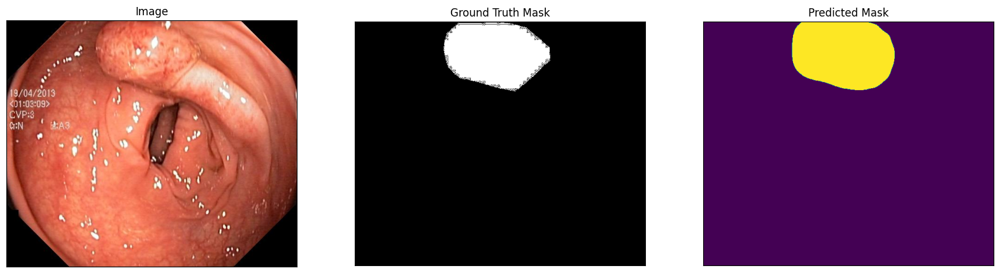

In [ ]:
dlv3p_plus_MBNet.visualize_predicted_result()

## Final Result


In [12]:
models = ['UNet with Resnet50', 'UNet with MobileNetV2', 'UNet++ with Resnet50',
          'UNet++ with MobileNetV2', 'PSPNet with Resnet50', 'PSPNet with MobileNetV2', 'DeepLabV3Plus with Resnet50', 'DeepLabV3Plus with MobileNetV2']

models_short_names = ['UR', 'UM', 'UPR', 'UPM', 'PR', 'PM', 'DR', 'DM']


iou_scores = [0.9261, 0.9012, 0.9229, 0.9086, 0.8652, 0.7686, 0.9064, 0.9264]

dice_losses = [0.0837, 0.1028, 0.0505, 0.0582, 0.0813, 0.1414, 0.0684, 0.0571]

dice_scores = [0.9163, 0.8972, 0.9495, 0.9418, 0.9187, 0.8586, 0.9316, 0.9429]

In [19]:
def CategoricalPlot(models, values, subtitle):
    plt.figure(figsize=(14, 4))

    plt.subplot(131)
    plt.bar(models, values)
    plt.subplot(132)
    plt.scatter(models, values)
    plt.subplot(133)
    plt.plot(models, values)
    plt.suptitle(subtitle)
    plt.show()

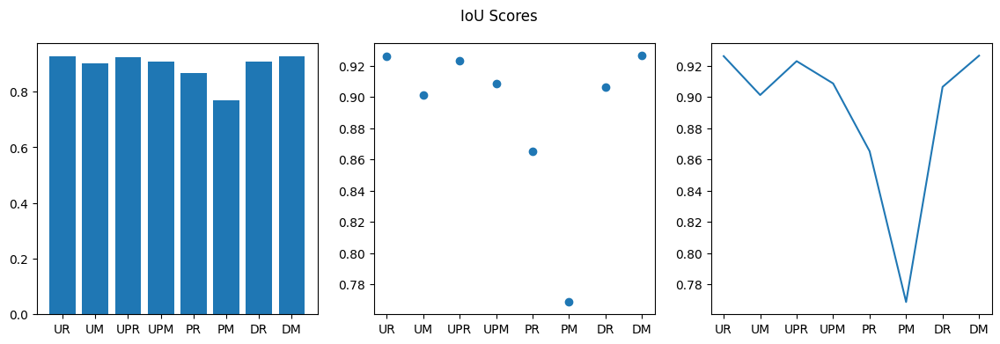

In [20]:
CategoricalPlot(models_short_names, iou_scores, "IoU Scores")

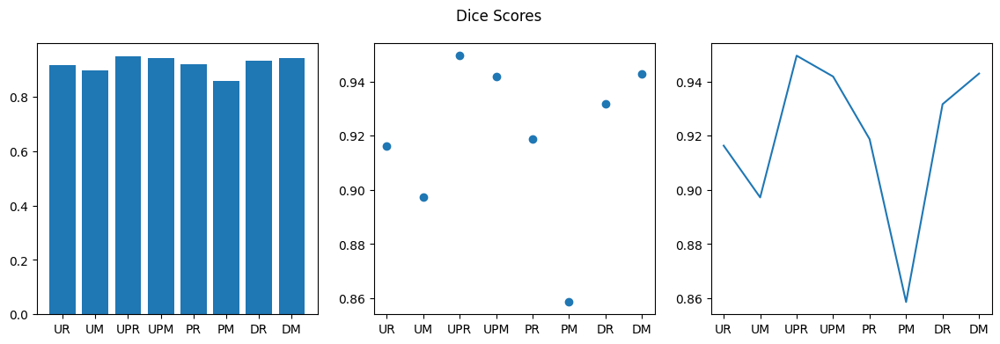

In [21]:
CategoricalPlot(models_short_names, dice_scores, "Dice Scores")

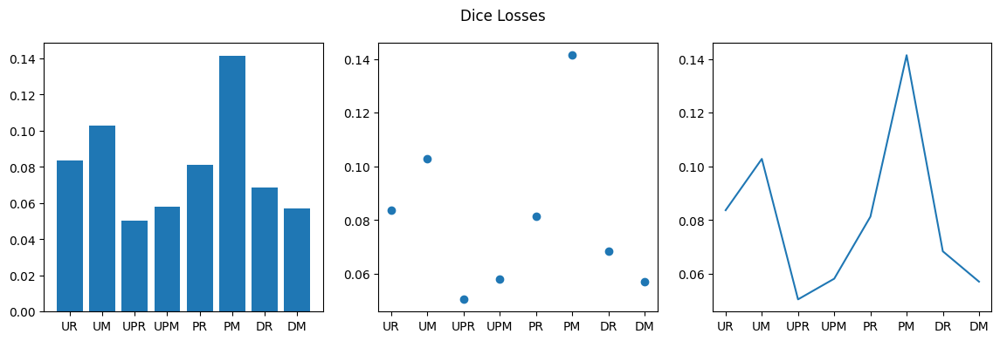

In [22]:
CategoricalPlot(models_short_names, dice_losses, "Dice Losses")

## Conclusion


#### State-of-the-art Model : UNet++ with ResNet
